In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import plotly.graph_objects as go

landmark_path = "/kaggle/input/asl-fingerspelling/train_landmarks/1019715464.parquet"
def read_parquet_file(landmark_path):
    landmarks = pd.read_parquet(landmark_path)
    return landmarks
landmarks = read_parquet_file(landmark_path)


In [2]:
#Define landmark connections
connections = [  
        [0, 1, 2, 3, 4,],
        [0, 5, 6, 7, 8],
        [0, 9, 10, 11, 12],
        [0, 13, 14, 15, 16],
        [0, 17, 18, 19, 20],
]

In [3]:
def get_chronological_sequence_id(index):
    sequence_id = np.unique(landmarks.index.values)[index]
    return sequence_id

In [4]:
def dataset_slice_by_sequence_id(landmarks, sequence_id):
    return landmarks.loc[landmarks.index == sequence_id]

In [68]:
def get_phrase(sequence_id):
    train_csv = pd.read_csv("/kaggle/input/asl-fingerspelling/train.csv")
    return train_csv[train_csv["sequence_id"] == sequence_id]["phrase"]

In [6]:
def get_frame_of_sequence(sequence_id, frame_num):
    frame = landmarks.loc[(landmarks.index == sequence_id) & (landmarks["frame"] == frame_num)]
    return frame

In [7]:
def get_unique_columns(landmarks):
    unique_columns = []
    for col in landmarks.columns.tolist():
        if col[:col.rfind("_")] not in unique_columns:
            unique_columns.append(col[:col.rfind("_")])
    return unique_columns

In [8]:

def get_lists_by_column(frame):
    x_left_hand = [col for col in frame.columns if col.startswith("x_left_hand")]
    x_left_hand = frame[x_left_hand]
    x_left_hand = x_left_hand.values

    y_left_hand = [col for col in frame.columns if col.startswith("y_left_hand")]
    y_left_hand = frame[y_left_hand]
    y_left_hand = y_left_hand.values

    x_right_hand = [col for col in frame.columns if col.startswith("x_right_hand")]
    x_right_hand = frame[x_right_hand]
    x_right_hand = x_right_hand.values

    y_right_hand = [col for col in frame.columns if col.startswith("y_right_hand")]
    y_right_hand = frame[y_right_hand]
    y_right_hand = y_right_hand.values

    x_face = [col for col in frame.columns if col.startswith("x_face")]
    x_face = frame[x_face]
    x_face = x_face.values

    y_face = [col for col in frame.columns if col.startswith("y_face")]
    y_face = frame[y_face]
    y_face = y_face.values

    x_pose = [col for col in frame.columns if col.startswith("x_pose")]
    x_pose = frame[x_pose]
    x_pose = x_pose.values

    y_pose = [col for col in frame.columns if col.startswith("y_pose")]
    y_pose = frame[y_pose]
    y_pose = y_pose.values
    
    return x_left_hand[0], y_left_hand[0], x_right_hand[0], y_right_hand[0] 

In [9]:
def get_frame_count_of_sequence(chronological_sequence_id):
    return dataset_slice_by_sequence_id(landmarks, get_chronological_sequence_id(chronological_sequence_id)).shape[0]

In [10]:
def get_line_coordinates(connections, x_left_hand, y_left_hand, x_right_hand, y_right_hand):
    x_vals = []
    y_vals = []

    for connection in connections:
        if not np.isnan(x_left_hand[0]):
            x_vals.extend([x_left_hand[connection]])
            y_vals.extend([y_left_hand[connection]])
        if not np.isnan(x_right_hand[0]):
            x_vals.extend([x_right_hand[connection]])
            y_vals.extend([y_right_hand[connection]])

    return x_vals, y_vals       

In [39]:
def draw(sequence_index, frame_num):
    plt.switch_backend("Agg")
    sequence_id = get_chronological_sequence_id(sequence_index)
    
    frame = get_frame_of_sequence(sequence_id, frame_num)
    
    x_left_hand, y_left_hand, x_right_hand, y_right_hand = get_lists_by_column(frame)
    x_vals, y_vals = get_line_coordinates(connections, x_left_hand, y_left_hand,
                                          x_right_hand, y_right_hand)  
    
    plt.scatter(x_left_hand, y_left_hand)
    plt.scatter(x_right_hand, y_right_hand)
    
    plt.axis("off")

    for i in range(0, len(x_vals)):
        plt.plot(x_vals[i], y_vals[i], color = "green")
        
    fig = plt.gcf()
    canvas = fig.canvas
    canvas.draw()
    array = np.array(canvas.renderer.buffer_rgba())
    plt.switch_backend('module://matplotlib_inline.backend_inline')
    return array
    #plt.imshow(array)


In [70]:
INDEX = 2
num_frames = get_frame_count_of_sequence(INDEX)
images = []

for i in range(num_frames):
    images.append(draw(INDEX, i))
    

IndexError: index 0 is out of bounds for axis 0 with size 0

In [72]:
get_phrase(get_chronological_sequence_id(INDEX))

30289    mirandasphysiosteps.com
Name: phrase, dtype: object

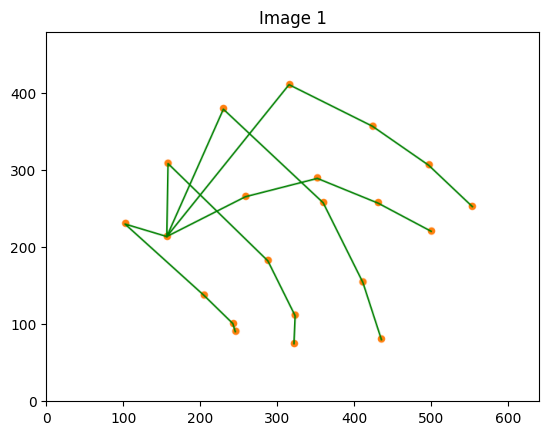

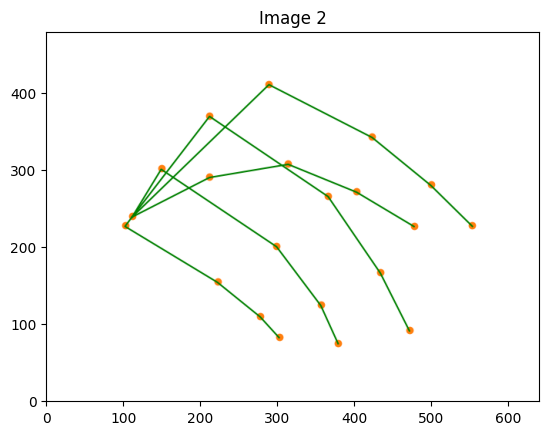

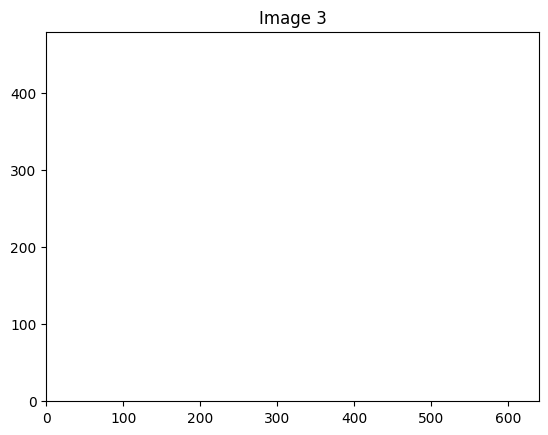

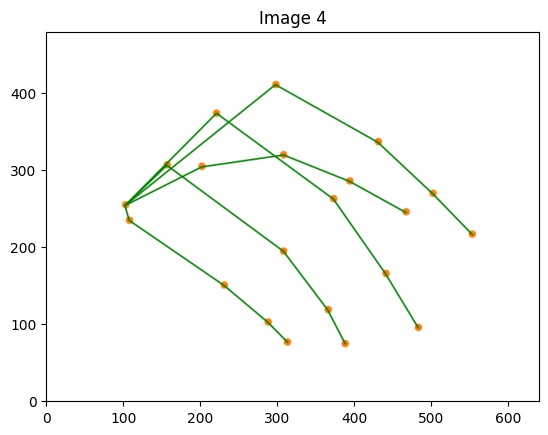

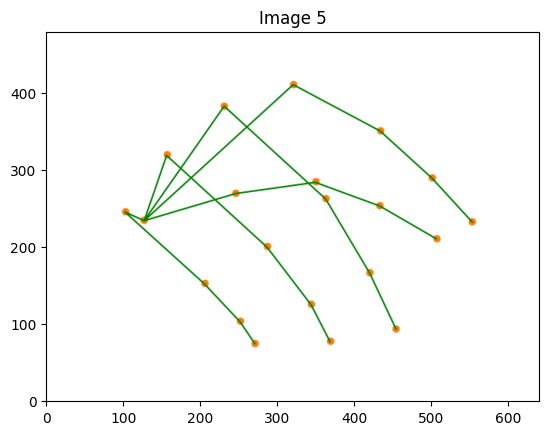

...

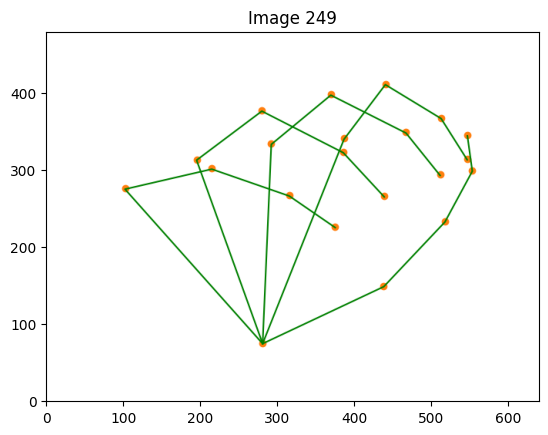

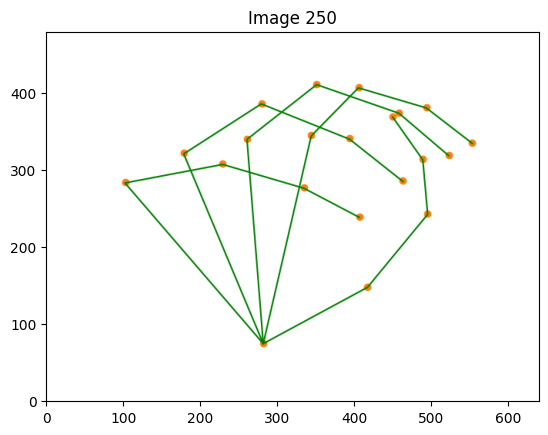

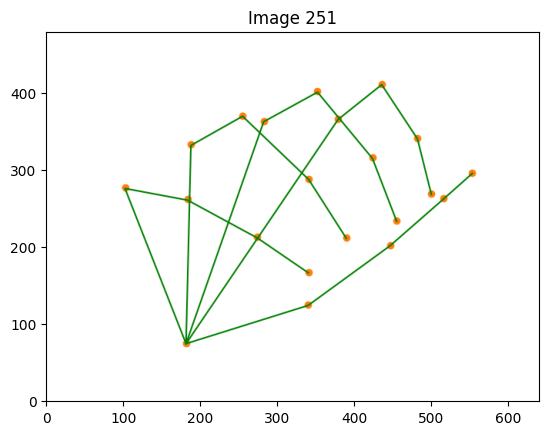

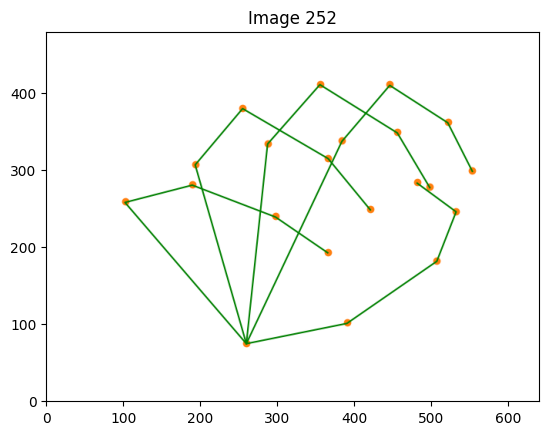

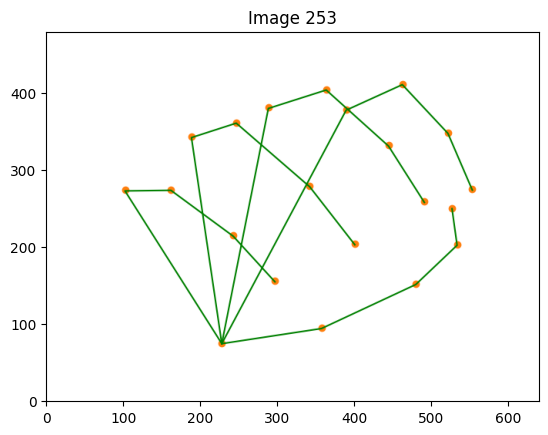

In [49]:
for i, image in enumerate(images):
    # Create a new figure and axis for each image
    fig, ax = plt.subplots()

    # Display the image
    ax.imshow(image, cmap='gray')
    ax.set_title(f"Image {i+1}")

    # Show the figure
    plt.gca().invert_yaxis()
    plt.show()